In [ ]:
##### Good job!

### Day 3 Exercises

**Economics data set analysis**

The folder economics (../data/economics/) has a set of small datasets corresponding to different economics topics. We will use Pandas to incorporate these datasets into our workflow, merge them and analyze the economic trends as a function of time.

To achieve this, do the following

1. Read each of the csv files iteratively
2. Merge all of the data into a single dataframe by building a dictionary where the keys are the codes and the values are the Series from each downloaded file
3. Construct the Term and Default premia series using basic math on the series, and mmerge the resulting series using JOIN operation. HINT: term_premium = merged_data[’GS10’] - merged_data[’GS1’] and default_premium = merged_data[’BAA’] - merged_data[’AAA’]
4. Process the data
5. Plot ’GDP_growth’,’IP_growth’ and 'Unemp_rate' a a function of time and draw inferences
6. Use pandas function scatter_matrix to generate scatter plots of ’GDP_growth’,’IP_growth’ and 'Unemp_rate' in a mmatrix form with kernel density plots along the diagonals.

Note: Processing the data is of utmost importance for better readability and understanding of the data. Process the above data by ensuring the following

1. dropping the rows with null values
2. Output data regularly to see if they are following regular format. Use pandas.series.pct_change wherever necessary

**The codes and their corresponding series representation**

                            Series                   Code           Frequency
                            Real GDP                 GDPC1          Quarterly
                            Industrial Production   INDPRO          Quarterly
                            Core CPI               CPILFESL         Monthly
                            Unemployment Rate       UNRATE          Monthly
                            10 Year Yield            GS10           Monthly
                            1 Year Yield             GS1            Monthly
                            Baa Yield                BAA            Monthly
                            Aaa Yield                AAA            Monthly
                            
** Variable Description **

                            Series                        Description
                            Treated                       Dummy indicating whether the candidate received the treatment
                            Age                           Age in years
                            Education (years)             Years of Education
                            Black                         Dummy indicating African-American
                            Hispanic                      Dummy indicating Hispanic
                            Married                       Dummy indicating married
                            Real income Before ($)        Income before program
                        Real income After ($)         Income after program           


In [41]:
#1. Read each of the csv files iteratively

#import libraries
import os
import pandas as pd

#change to directory
%cd ~/Documents/DSE/2019-rgm001/DSE200/data/economics/

#define directory where csv files data will be stored
data_ = dict()

#iterate thorugh every csv file
for file_ in os.listdir():
    
    #read with pandas dataframe
    temp_data = pd.read_csv(file_)
    
    #parse csv file name
    file_name = file_.split('.')[0] 
    
    #add data to a nested dictionary
    data_[file_name] = {}
    data_[file_name]['DATE'] = {}
    data_[file_name]['VALUE'] = {}
    data_[file_name]['DATE'] = temp_data.DATE
    data_[file_name]['VALUE'] = temp_data.VALUE
data_

/home/raulmartinez/Documents/DSE/2019-rgm001/DSE200/data/economics


{'AAA': {'DATE': 0       1919-01-01
  1       1919-02-01
  2       1919-03-01
  3       1919-04-01
  4       1919-05-01
             ...    
  1144    2014-05-01
  1145    2014-06-01
  1146    2014-07-01
  1147    2014-08-01
  1148    2014-09-01
  Name: DATE, Length: 1149, dtype: object, 'VALUE': 0       5.35
  1       5.35
  2       5.39
  3       5.44
  4       5.39
          ... 
  1144    4.16
  1145    4.25
  1146    4.16
  1147    4.08
  1148    4.11
  Name: VALUE, Length: 1149, dtype: float64},
 'BAA': {'DATE': 0       1919-01-01
  1       1919-02-01
  2       1919-03-01
  3       1919-04-01
  4       1919-05-01
             ...    
  1144    2014-05-01
  1145    2014-06-01
  1146    2014-07-01
  1147    2014-08-01
  1148    2014-09-01
  Name: DATE, Length: 1149, dtype: object, 'VALUE': 0       7.12
  1       7.20
  2       7.15
  3       7.23
  4       7.09
          ... 
  1144    4.76
  1145    4.80
  1146    4.73
  1147    4.69
  1148    4.80
  Name: VALUE, Length: 1149, dty

In [42]:
#2. Merge all of the data into a single dataframe by building a dictionary where the keys are the codes 
#and the values are the Series from each downloaded file

#read code and series as dictionary
code_series = [('GDPC1','Real GDP'),('INDPRO','Industrial Production'),('CPILFESL','Core CPI'),
                    ('UNRATE','Unemployment Rate'),('GS10','10 Year Yield'),('GS1','1 Year Yield'),
                    ('BAA','Baa Yield'),('AAA','Aaa Yield')]
dict_code_series = dict(code_series)
print(dict_code_series)

#change value name on the previously define dictionary where csv files were read iteratively
for i in data_:
    new_key = dict_code_series[i]
    data_[i][new_key] = data_[i].pop('VALUE')
print(data_)   

#create dataframe from dictionary
import pandas as pd
df_aggregated = pd.DataFrame()
for i in data_:
    #use try statement to merge empty dataframe
    try:
        df_aggregated = pd.merge(df_aggregated,pd.DataFrame(data_[i]),how='outer',on='DATE')
    except KeyError:
        df_aggregated = pd.DataFrame(data_[i])
print(df_aggregated)

{'GDPC1': 'Real GDP', 'INDPRO': 'Industrial Production', 'CPILFESL': 'Core CPI', 'UNRATE': 'Unemployment Rate', 'GS10': '10 Year Yield', 'GS1': '1 Year Yield', 'BAA': 'Baa Yield', 'AAA': 'Aaa Yield'}
{'AAA': {'DATE': 0       1919-01-01
1       1919-02-01
2       1919-03-01
3       1919-04-01
4       1919-05-01
           ...    
1144    2014-05-01
1145    2014-06-01
1146    2014-07-01
1147    2014-08-01
1148    2014-09-01
Name: DATE, Length: 1149, dtype: object, 'Aaa Yield': 0       5.35
1       5.35
2       5.39
3       5.44
4       5.39
        ... 
1144    4.16
1145    4.25
1146    4.16
1147    4.08
1148    4.11
Name: VALUE, Length: 1149, dtype: float64}, 'BAA': {'DATE': 0       1919-01-01
1       1919-02-01
2       1919-03-01
3       1919-04-01
4       1919-05-01
           ...    
1144    2014-05-01
1145    2014-06-01
1146    2014-07-01
1147    2014-08-01
1148    2014-09-01
Name: DATE, Length: 1149, dtype: object, 'Baa Yield': 0       7.12
1       7.20
2       7.15
3       7.23
4 

In [43]:
#3. Construct the Term and Default premia series using basic math on the series, and mmerge the resulting series 
#using JOIN operation. HINT: term_premium = merged_data[’GS10’] - merged_data[’GS1’] and 
#default_premium = merged_data[’BAA’] - merged_data[’AAA’]

#compute math for new terms
term_premium = df_aggregated['10 Year Yield'] - df_aggregated['1 Year Yield']
print(term_premium)

default_premium = df_aggregated['Baa Yield'] - df_aggregated['Aaa Yield']
print(default_premium)

#create dataframe
df_newterms = pd.DataFrame({'term_premium':term_premium,'default_premium':default_premium})

#join resulting series with previous dataframe
df_aggregated = df_aggregated.join(df_newterms)
print(df_aggregated)

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
1144    2.46
1145    2.50
1146    2.43
1147    2.31
1148    2.42
Length: 1149, dtype: float64
0       1.77
1       1.85
2       1.76
3       1.79
4       1.70
        ... 
1144    0.60
1145    0.55
1146    0.57
1147    0.61
1148    0.69
Length: 1149, dtype: float64
            DATE  Aaa Yield  Baa Yield  Core CPI  Real GDP  1 Year Yield  \
0     1919-01-01       5.35       7.12       NaN       NaN           NaN   
1     1919-02-01       5.35       7.20       NaN       NaN           NaN   
2     1919-03-01       5.39       7.15       NaN       NaN           NaN   
3     1919-04-01       5.44       7.23       NaN       NaN           NaN   
4     1919-05-01       5.39       7.09       NaN       NaN           NaN   
...          ...        ...        ...       ...       ...           ...   
1144  2014-05-01       4.16       4.76   237.776       NaN          0.10   
1145  2014-06-01       4.25       4.80   238.083

In [85]:
#4. Process the data

#add GDP growth and IP Growth to aggregated dataframe, use periods = 20 to find the percent growth every 5 years
df_aggregated['GDP_growth'] = df_aggregated['Real GDP'].pct_change(periods=20)*100
df_aggregated['IP_growth'] = df_aggregated['Industrial Production'].pct_change(periods=20)*100
df_aggregated

,DATE,Aaa Yield,Baa Yield,Core CPI,Real GDP,1 Year Yield,10 Year Yield,Industrial Production,Unemployment Rate,term_premium,default_premium,GDP_growth,IP_growth
0,1919-01-01,5.35,7.12,NaN,NaN,NaN,NaN,4.8582,NaN,NaN,1.77,NaN,NaN
1,1919-02-01,5.35,7.20,NaN,NaN,NaN,NaN,4.6435,NaN,NaN,1.85,NaN,NaN
2,1919-03-01,5.39,7.15,NaN,NaN,NaN,NaN,4.5092,NaN,NaN,1.76,NaN,NaN
3,1919-04-01,5.44,7.23,NaN,NaN,NaN,NaN,4.5898,NaN,NaN,1.79,NaN,NaN
4,1919-05-01,5.39,7.09,NaN,NaN,NaN,NaN,4.6166,NaN,NaN,1.70,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1144,2014-05-01,4.16,4.76,237.776,NaN,0.10,2.56,103.6619,6.3,2.46,0.60,3.752762,6.443809
1145,2014-06-01,4.25,4.80,238.083,NaN,0.10,2.60,103.9503,6.1,2.50,0.55,3.736628,6.822654
1146,2014-07-01,4.16,4.73,238.311,NaN,0.11,2.54,104.1916,6.2,2.43,0.57,3.736628,6.036961
1147,2014-08-01,4.08,4.69,238.345,NaN,0.11,2.42,104.0187,6.1,2.31,0.61,3.736628,5.756168


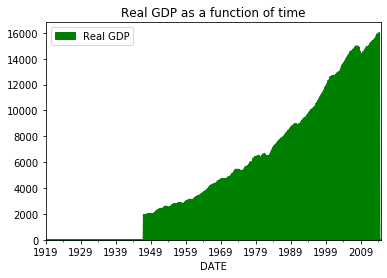

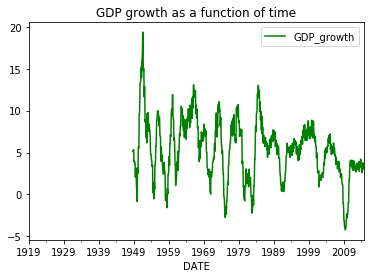

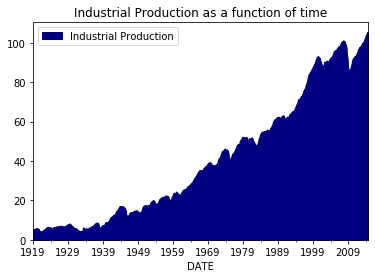

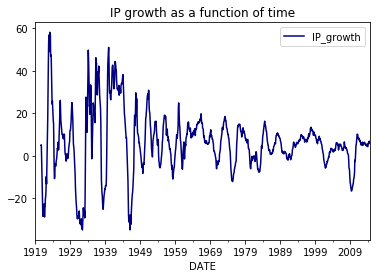

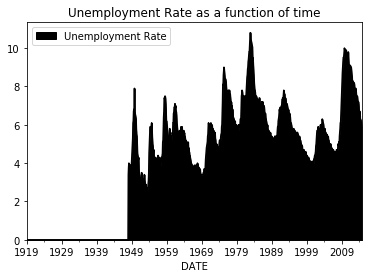

In [86]:
#5. Plot ’GDP_growth’,’IP_growth’ and 'Unemp_rate' a a function of time and draw inferences

#import libraries
import datetime

#convert date column to datetime
# df_aggregated['DATE'] = [datetime.datetime.strptime(i,'%Y-%m-%d') for i in df_aggregated['DATE']]

#plot unemployment rate, real gdp, industrial production and their respective growths
df_aggregated.plot(x='DATE',y='Real GDP',kind='area',title='Real GDP as a function of time', colormap='ocean')

df_aggregated.plot('DATE','GDP_growth',kind='line',title='GDP growth as a function of time', colormap='ocean')

df_aggregated.plot('DATE','Industrial Production',kind='area',title='Industrial Production as a function of time', colormap='gist_ncar')

df_aggregated.plot('DATE','IP_growth',kind='line',title='IP growth as a function of time', colormap='gist_ncar')

df_aggregated.plot('DATE','Unemployment Rate',kind='area',title='Unemployment Rate as a function of time', colormap='gnuplot2')

In [32]:
#print the data to verify it agrees with the plots

#GDP_growth data without nan - quaterly data
print(df_aggregated[['DATE','Real GDP']].dropna(axis=0))

#IP_growth data without nan - quaterly data
print(df_aggregated[['DATE','Industrial Production']].dropna(axis=0))

#Unemp_rate data without nan - monthly data
print(df_aggregated[['DATE','Unemployment Rate']].dropna(axis=0))

           DATE  Real GDP
336  1947-01-01    1934.5
339  1947-04-01    1932.3
342  1947-07-01    1930.3
345  1947-10-01    1960.7
348  1948-01-01    1989.5
...         ...       ...
1131 2013-04-01   15606.6
1134 2013-07-01   15779.9
1137 2013-10-01   15916.2
1140 2014-01-01   15831.7
1143 2014-04-01   16010.4

[270 rows x 2 columns]
           DATE  Industrial Production
0    1919-01-01                 4.8582
1    1919-02-01                 4.6435
2    1919-03-01                 4.5092
3    1919-04-01                 4.5898
4    1919-05-01                 4.6166
...         ...                    ...
1144 2014-05-01               103.6619
1145 2014-06-01               103.9503
1146 2014-07-01               104.1916
1147 2014-08-01               104.0187
1148 2014-09-01               105.0728

[1149 rows x 2 columns]
           DATE  Unemployment Rate
348  1948-01-01                3.4
349  1948-02-01                3.8
350  1948-03-01                4.0
351  1948-04-01                

## Inferences About The Data Above

Industrial production started in 1919 at about 5%, then it took about 30 years to increase production to around 17% in order to generate some monetary value where GDP Growth initiated in 1947; and in the same year Unemployment rate started at 3.4%. Both Real GDP and industrial production have been increasing steadily over the years and unemployment rate has been fluctuating from about 5-10%; it reached its highest in the 1980's. In the last 50 years, both Real GDP and Industrial Production have increased by more than 4-fold each. Additionally, the last record from 2014 shows that unemployment rate is considerably low at about 6%. 

In terms of growth, both line plots above show the percent growth of GDP and Industrial Production Growth every 5 years. The data shows positive GDP growth for the most part with a maximum increase of about 20% in the 1950's, and in the 2000's it reached its highest decrease at around -5%. On the other hand, industrial production change was quite variable from around 1919 to 1950 reaching a maximum increase of around 60% and a lowest at about -30%, and it then stabilized more over the years where it fluctuated from around -15% to 15% up to 2014.  

Additionally, if you look at the scatter matrix below there seems to be a poor, but noticeable, negative correlation between both GDP_growth and IP_growth with Unemployment Rate. While the positive correlation between GDP_growth and IP_growth is quite obvious. 

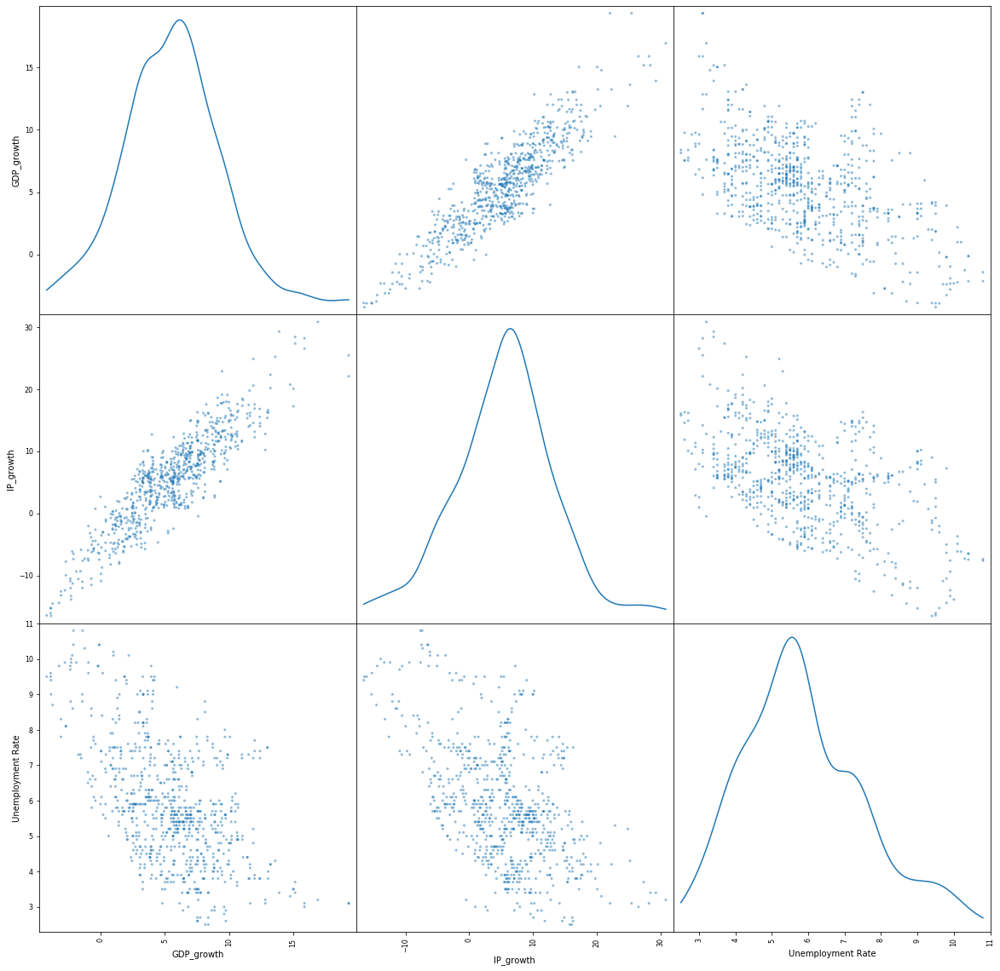

In [90]:
#6. Use pandas function scatter_matrix to generate scatter plots of ’GDP_growth’,’IP_growth’ and 'Unemp_rate' in 
#a mmatrix form with kernel density plots along the diagonals.

from pandas.plotting import scatter_matrix
scatter_matrix(df_aggregated[['GDP_growth','IP_growth','Unemployment Rate']].dropna(axis=0), alpha=0.5, 
               figsize=(20, 20), diagonal='kde');

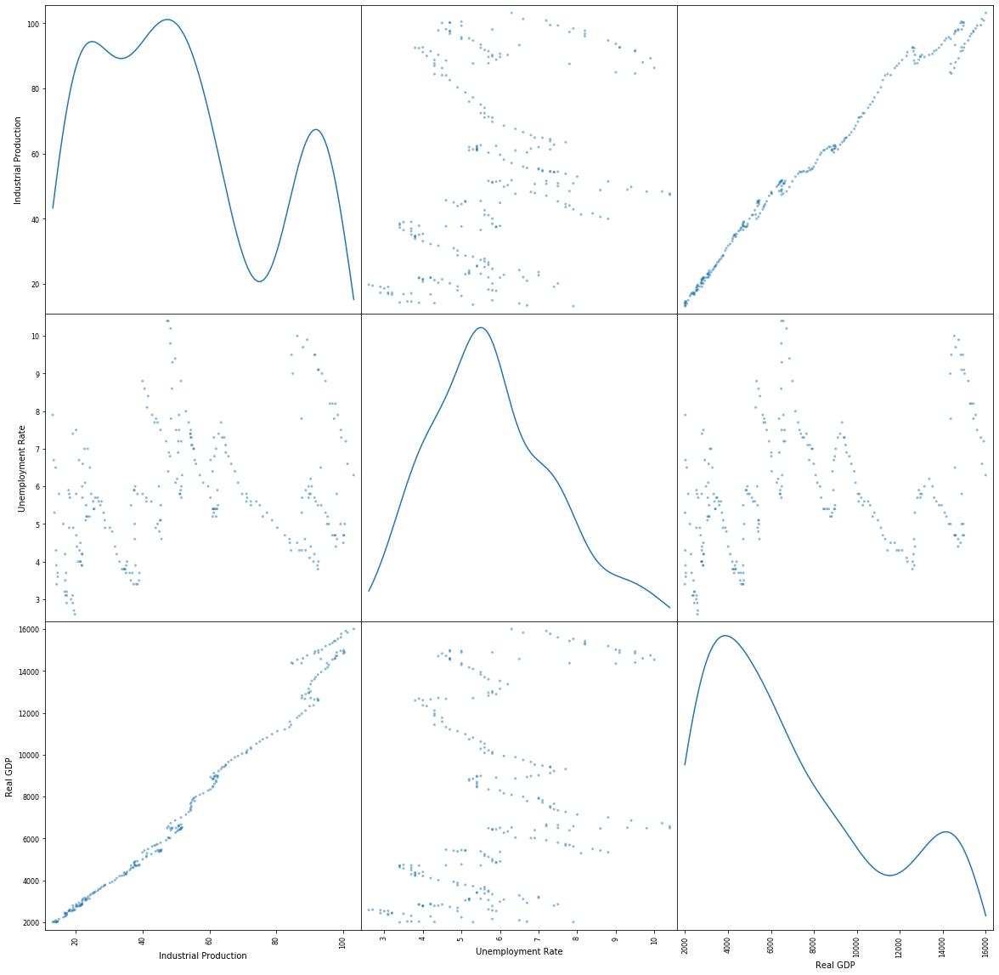

In [89]:
from pandas.plotting import scatter_matrix
scatter_matrix(df_aggregated[['Industrial Production','Unemployment Rate','Real GDP']].dropna(axis=0), alpha=0.5, 
               figsize=(20, 20), diagonal='kde');

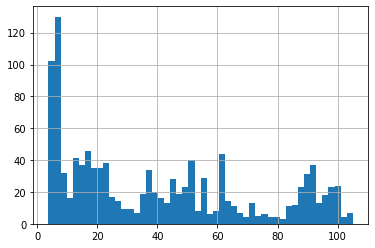

In [43]:
#plotting histogram to better understand diagonal Kernel Density Estimation
df_aggregated['Industrial Production'].hist(bins=50)

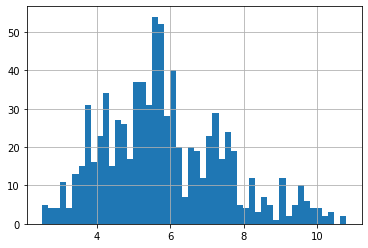

In [44]:
df_aggregated['Unemployment Rate'].hist(bins=50)

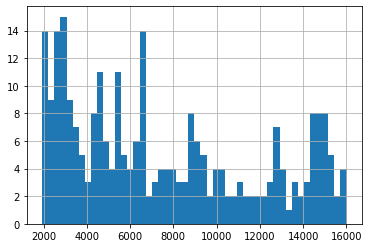

In [45]:
df_aggregated['Real GDP'].hist(bins=50)

**Nutrition dataset analysis**

Download the dataset from http://ashleyw.co.uk/files/foods-2011-10-03.json.zip
This data set is a compilation of data provided by the US department of Agriculture. The data set contains data for 6,636 unique foods and 94 unique nutrients (with an average of 56.5 nutrients per food)

Do the following

Use the built in python json module to load the food data into a python list

Your code should look like this

> import json
> db = json.load(open('foods-2011-10-03.json'))

db will be a list of 6636 python dictionaries, each containing nutritional information for a different food item. Each dictionary will have the following keys:

    1.portions
    2.description
    3.tags
    4.nutrients
    5.group
    6.id
    7.manufacture

Now, create a DataFrame of meta_data using the description, group, id, and manufacturer items in each dictionary.

Loop over db and construct a list of DataFrames containing the nutritional information for each record in db. Make sure to add a column to each of these DataFrames that contains the unique food id (id key in the dictionary)

Finally, use the pandas combining techniques to create a nutrients DataFrame. After you have done this drop duplicate entries in this DataFrame. For example, if you had named the objects nuts you would do

nuts = nuts.drop_duplicates()

Use the rename method to make sure that the description and group columns are un-ambiguous for both the meta_data DataFrame and the nutrients DataFrame (These column names are duplicated because every food has a description and group and each nutrient also has those identifiers). 

Finally, use the data combining routines to come up with a foods DataFrame containing all the meta_data and nutritional information. Make sure to do an outer style merge on the correct columns.

Using the foods DataFrame you have been building, compute the following things:

1. The food item with the highest content of each nutrient.
2. A function that accepts a nutrient name and a quantile value and generates a horizontal bar plot of the amount of that nutrient in each food group. Provide a plot title. HINT: You will need to use the quantile and sort (or order ) methods in order for this to work. 

In [1]:
#import libraries
import json

#download file using curl
%cd ~/Documents/DSE/2019-rgm001/DSE200/day_3_models_and_learning
# !curl https://raw.githubusercontent.com/wesm/pydata-book/2nd-edition/datasets/usda_food/database.json > foods-2011-10-03.json

/home/raulmartinez/Documents/DSE/2019-rgm001/DSE200/day_3_models_and_learning


In [2]:
#read JSON file
db = json.load(open('foods-2011-10-03.json'))
db

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [3]:
#print first entry for visualization
db[0:1]

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [5]:
#import libraries
import pandas as pd

#Now, create a DataFrame of meta_data using the description, group, id, and manufacturer items in each dictionary.

#define keys we want to extract
metaData = ['description','group','id','manufacturer']

#define empty list and start count
df_metaData = pd.DataFrame(columns = metaData)
count = 0

#loop through every dictionary on the list
for dict_ in db:
    df_metaData.loc[count] = [dict_[i] for i in metaData]
    count+=1
df_metaData

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [6]:
#Loop over db and construct a list of DataFrames containing the nutritional information for each record in db. 
#Make sure to add a column to each of these DataFrames that contains the unique food id (id key in the dictionary)

#define empty list
nutritionalInfo_list = []

#loop over every dictionary
for dict_ in db:
    
    #make dataframe of nutrients and add id column
    temp_df = pd.DataFrame(dict_['nutrients'])
    temp_df['id'] = dict_['id']
    
    #construct a list of dataframes
    nutritionalInfo_list.append(temp_df)

In [7]:
#check first element of list
nutritionalInfo_list[0]

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
157,1.472,g,Serine,Amino Acids,1008
158,93.000,mg,Cholesterol,Other,1008
159,18.584,g,"Fatty acids, total saturated",Other,1008
160,8.275,g,"Fatty acids, total monounsaturated",Other,1008


In [8]:
#check element number 6000
nutritionalInfo_list[6000]

,value,units,description,group,id
0,21.460,g,Protein,Composition,15214
1,4.630,g,Total lipid (fat),Composition,15214
2,0.000,g,"Carbohydrate, by difference",Composition,15214
3,1.620,g,Ash,Other,15214
4,133.000,kcal,Energy,Energy,15214
5,71.910,g,Water,Composition,15214
6,556.000,kJ,Energy,Energy,15214
7,0.000,g,"Fiber, total dietary",Composition,15214
8,22.000,mg,"Calcium, Ca",Elements,15214
9,0.350,mg,"Iron, Fe",Elements,15214


In [9]:
#Finally, use the pandas combining techniques to create a nutrients DataFrame. After you have done this drop duplicate 
#entries in this DataFrame. For example, if you had named the objects nuts you would do

#define empty dataframe
df_nutrients = pd.DataFrame()

#loop trough list and concatenate dataframes to a single dataframe
for list_ in nutritionalInfo_list:
    df_nutrients = pd.concat([df_nutrients,list_])

In [10]:
df_nutrients

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [11]:
#After you have done this drop duplicate entries in this DataFrame. 
#For example, if you had named the objects nuts you would do

df_nutrients = df_nutrients.drop_duplicates()
df_nutrients

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [142]:
#Use the rename method to make sure that the description and group columns are un-ambiguous for both 
#the meta_data DataFrame and the nutrients DataFrame (These column names are duplicated because every food 
#has a description and group and each nutrient also has those identifiers).

In [12]:
df_metaData = df_metaData.rename(columns={'description': 'description_MetaData', 'group': 'group_MetaData'})
df_metaData

,description_MetaData,group_MetaData,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [13]:
df_nutrients = df_nutrients.rename(columns={'description': 'description_Nutrients', 'group': 'group_Nutrients'})
df_nutrients

,value,units,description_Nutrients,group_Nutrients,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [14]:
#Finally, use the data combining routines to come up with a foods DataFrame containing all the meta_data 
#and nutritional information. Make sure to do an outer style merge on the correct columns.

df_foods = pd.merge(df_metaData,df_nutrients,how='outer',on='id')
df_foods

,description_MetaData,group_MetaData,id,manufacturer,value,units,description_Nutrients,group_Nutrients
0,"Cheese, caraway",Dairy and Egg Products,1008,,25.180,g,Protein,Composition
1,"Cheese, caraway",Dairy and Egg Products,1008,,29.200,g,Total lipid (fat),Composition
2,"Cheese, caraway",Dairy and Egg Products,1008,,3.060,g,"Carbohydrate, by difference",Composition
3,"Cheese, caraway",Dairy and Egg Products,1008,,3.280,g,Ash,Other
4,"Cheese, caraway",Dairy and Egg Products,1008,,376.000,kcal,Energy,Energy
...,...,...,...,...,...,...,...,...
375171,"Babyfood, banana no tapioca, strained",Baby Foods,43546,None,0.000,mcg,"Vitamin B-12, added",Vitamins
375172,"Babyfood, banana no tapioca, strained",Baby Foods,43546,None,0.000,mg,Cholesterol,Other
375173,"Babyfood, banana no tapioca, strained",Baby Foods,43546,None,0.072,g,"Fatty acids, total saturated",Other
375174,"Babyfood, banana no tapioca, strained",Baby Foods,43546,None,0.028,g,"Fatty acids, total monounsaturated",Other


In [35]:
#Using the foods DataFrame you have been building, compute the following things:
#1. The food item with the highest content of each nutrient.

df_foods_MaxNutrients = df_foods.groupby(['description_Nutrients']).agg({'value':'max'})
df_foods_MaxNutrients['description_MetaData'] = [df_foods.description_MetaData[(df_foods.description_Nutrients == nutrient)&(df_foods.value == value)].values[0] for nutrient,value in zip(df_foods_MaxNutrients.index,df_foods_MaxNutrients.value)]

print(df_foods_MaxNutrients.to_string())

                                         value                               description_MetaData
description_Nutrients                                                                            
Adjusted Protein                        12.900             Baking chocolate, unsweetened, squares
Alanine                                  8.009                  Gelatins, dry powder, unsweetened
Alcohol, ethyl                          42.500  Alcoholic beverage, distilled, all (gin, rum, ...
Arginine                                 7.436                       Seeds, sesame flour, low-fat
Ash                                     72.500             Desserts, rennin, tablets, unsweetened
Aspartic acid                           10.203                                Soy protein isolate
Beta-sitosterol                        426.000  Oil, vegetable, Natreon canola, high stability...
Betaine                                630.400                                   Quinoa, uncooked
Caffeine            

In [92]:
#2. A function that accepts a nutrient name and a quantile value and generates a horizontal bar plot of the amount 
#of that nutrient in each food group. Provide a plot title. HINT: You will need to use the quantile and sort (or order ) 
#methods in order for this to work.

#import libraries
import matplotlib.pyplot as plt
import numpy as np

#check what are the options for food nutrient names
np.unique(df_foods.description_Nutrients)

array(['Adjusted Protein', 'Alanine', 'Alcohol, ethyl', 'Arginine', 'Ash',
       'Aspartic acid', 'Beta-sitosterol', 'Betaine', 'Caffeine',
       'Calcium, Ca', 'Campesterol', 'Carbohydrate, by difference',
       'Carotene, alpha', 'Carotene, beta', 'Cholesterol',
       'Choline, total', 'Copper, Cu', 'Cryptoxanthin, beta', 'Cystine',
       'Dihydrophylloquinone', 'Energy',
       'Fatty acids, total monounsaturated',
       'Fatty acids, total polyunsaturated',
       'Fatty acids, total saturated', 'Fatty acids, total trans',
       'Fatty acids, total trans-monoenoic',
       'Fatty acids, total trans-polyenoic', 'Fiber, total dietary',
       'Fluoride, F', 'Folate, DFE', 'Folate, food', 'Folate, total',
       'Folic acid', 'Fructose', 'Galactose', 'Glucose (dextrose)',
       'Glutamic acid', 'Glycine', 'Histidine', 'Hydroxyproline',
       'Iron, Fe', 'Isoleucine', 'Lactose', 'Leucine',
       'Lutein + zeaxanthin', 'Lycopene', 'Lysine', 'Magnesium, Mg',
       'Maltose', '

In [93]:
#define function
def plot_nutrient_quantile(nutrient_name,quantile_value):
    
    #filter dataframe to only include selected nutrient
    df_foods_nutrient = df_foods[df_foods.description_Nutrients==nutrient_name]
    
    #find the units
    units = np.unique(df_foods.units[df_foods.description_Nutrients==nutrient_name])[0]
    
    #create empty list to save tuple
    list_ = []
    
    #find quantile value for each group
    for group in np.unique(df_foods_nutrient.group_MetaData):
        list_.append((group,np.quantile(df_foods_nutrient.value[df_foods_nutrient.group_MetaData==group],quantile_value)))

    #create dataframe for plotting
    df_nutrient_quantile = pd.DataFrame(list_, columns = ['group','quantile_value'])
    df_nutrient_quantile = df_nutrient_quantile.sort_values(by=['quantile_value'])

    #generate horizontal bar plot
    df_nutrient_quantile.plot('group','quantile_value',kind='barh', figsize = (20,20), fontsize = 18, grid=True,legend=False)
    plt.title('Amount of '+nutrient_name+' in each food group for quantile '+str(quantile_value)+'\n'+'Units: '+units, 
              fontsize=20)

    #show plot
    plt.show()

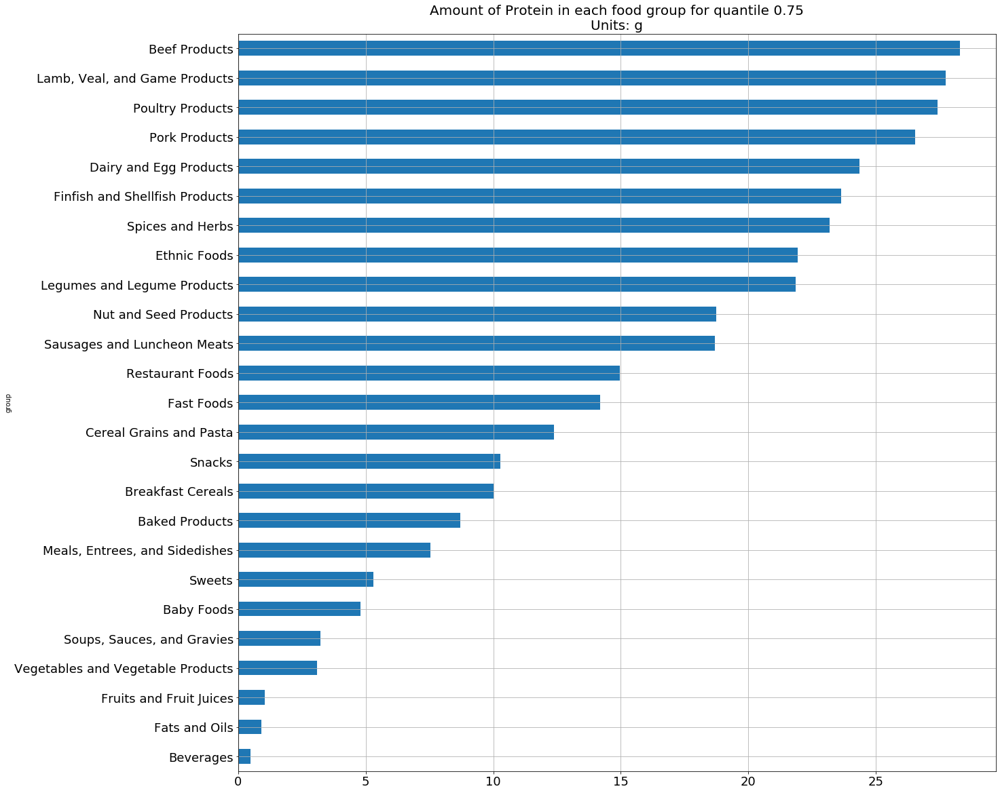

In [103]:
#Define user inputs
nutrient_name = 'Protein'
quantile_value = 0.75

#call function
plot_nutrient_quantile(nutrient_name,quantile_value)

**Classifying Digits**
SKLearn has many intereting datasets pre-loaded in it, one of which is load_digits (sklearn.datasets.load_digits - http://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_digits.html). Load_digits is a dataset of digits, with each datapoint being a 8x8 image of a digit. 

You can load this dataset as follows

In [86]:
from sklearn.datasets import load_digits
digits = load_digits()

And the images can be visualized as follows

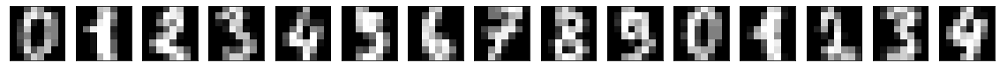

In [312]:
import pylab as pl 

#code given
# pl.gray() 
# pl.matshow(digits.images[9]) 
# pl.show() 

#define function to plot digits from load_digits data
def plot_digits(data):
    fig, axes = plt.subplots(1, 15, figsize=(20, 20),subplot_kw={'xticks':[], 'yticks':[]})
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(8, 8), cmap='gray', interpolation='nearest', clim=(0, 16))
        
def plot_faces(data):
    fig, axes = plt.subplots(1, 15, figsize=(20, 20),subplot_kw={'xticks':[], 'yticks':[]})
    for i, ax in enumerate(axes.flat):
        ax.imshow(data[i].reshape(62, 47), cmap='binary_r')

plot_digits(digits.images)

Visualize the first 15 digits to get a better understanding of the data

**Dimensionality Reduction - PCA**

Principal Component Analysis is a very powerful unsupervised method for dimensionality reduction in data. 

Apply dimensionality reduction technique PCA (Principle Component Analysis) on the prev dataset - load_digits(). 
Use the sklearn inbuilt tool sklearn.decomposition.PCA

Print the shape of the matrix before and after the application of PCA on the dataset. Using variance, analyze the amount of information thrown away and plot the variance(cumulative) against the number of components  

In [97]:
#import libraries
from sklearn.decomposition import PCA
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits

#save data for the digits as a variable
digits = load_digits()

#project the data from 64 dimensions to 2 dimensions
pca = PCA(n_components=2)

#dimensionality reduction
digits_projected = pca.fit_transform(digits.data)

#print the shape of original data and pca applied
print(digits.data.shape) #original
print(digits_projected.shape) #projected

(1797, 64)
(1797, 2)


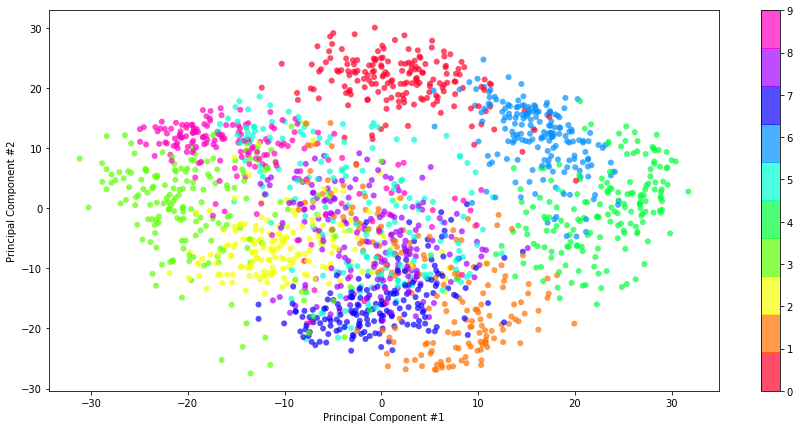

In [124]:
#plot the first two principal components from above
fig = plt.figure(1,figsize=(15,7))
plt.scatter(digits_projected[:, 0], digits_projected[:, 1],c=digits.target, 
            edgecolor='none', alpha=0.7,cmap=plt.cm.get_cmap('gist_rainbow', 10))
plt.xlabel('Principal Component #1')
plt.ylabel('Principal Component #2')
plt.colorbar()

"""

You can see from the image below that two dimensions is probably not enough to explain differences among all 10 digits

"""

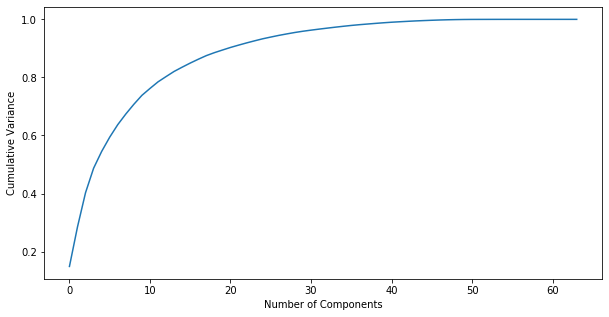

In [213]:
#plot the cumulative variance explained vs. the number of components

#measure pca and fit
pca = PCA().fit(digits.data)

#plot cumulative variance
fig = plt.figure(1,figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance');

Variance: 0.2, Number of Components: 2
Variance: 0.4, Number of Components: 3
Variance: 0.6, Number of Components: 7
Variance: 0.8, Number of Components: 13
Variance: 0.9, Number of Components: 21
Variance: 0.999999999, Number of Components: 61


'\n\nFrom the images below you can see how reducing from 64 components (or 61 in this example, ~100%) to 21, which is \nabout 90% of the variance preserved can give a pretty good approximation from the original image. I think \nthe digits can even be well differentiated when using 80% of the variance, which is about 13 components. \n\n'

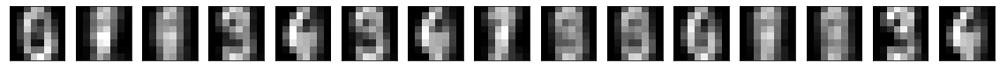

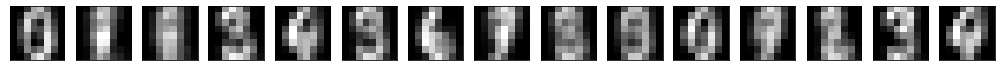

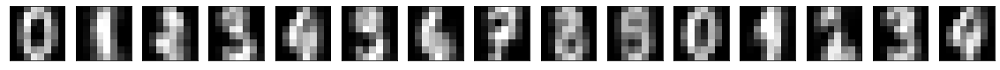

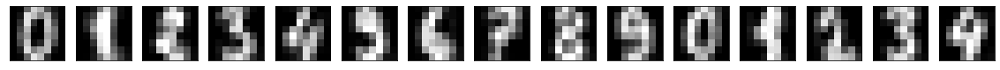

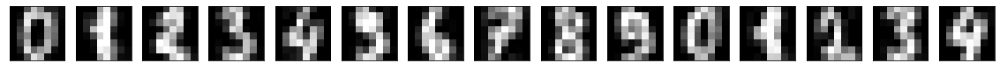

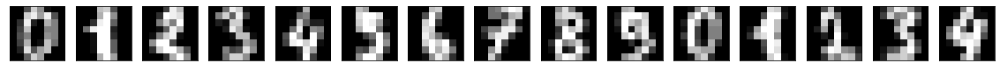

In [239]:
#plot different projections where 20%,40%,60%,80%, and ~100% of the variance is preserved
for i in [0.2,0.4,0.6,0.8,0.9,0.999999999]:
    pca = PCA(i).fit(digits.data)
    print('Variance: ' + str(i) + ', Number of Components: ' + str(pca.n_components_))
    components = pca.transform(digits.data)
    filtered = pca.inverse_transform(components)
    plot_digits(filtered)
    
"""

From the images below you can see how reducing from 64 components (or 61 in this example, ~100%) to 21, which is 
about 90% of the variance preserved can give a pretty good approximation from the original image. I think 
the digits can even be well differentiated when using 80% of the variance, which is about 13 components. 

"""

['Ariel Sharon' 'Colin Powell' 'Donald Rumsfeld' 'George W Bush'
 'Gerhard Schroeder' 'Hugo Chavez' 'Junichiro Koizumi' 'Tony Blair']
(1348, 62, 47)
PCA
Number of Components: 10
Time Elapsed (ms): 97.14627265930176
PCA Randomized
Number of Components: 10
Time Elapsed (ms): 60.0283145904541


PCA
Number of Components: 100
Time Elapsed (ms): 376.94764137268066
PCA Randomized
Number of Components: 100
Time Elapsed (ms): 208.40954780578613


PCA
Number of Components: 1000
Time Elapsed (ms): 2034.618854522705
PCA Randomized
Number of Components: 1000
Time Elapsed (ms): 1563.3456707000732




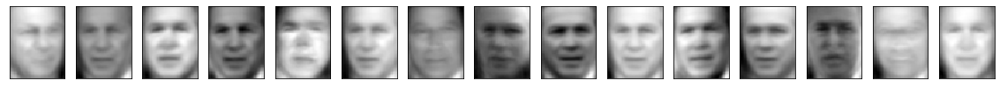

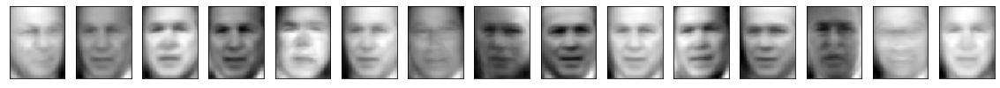

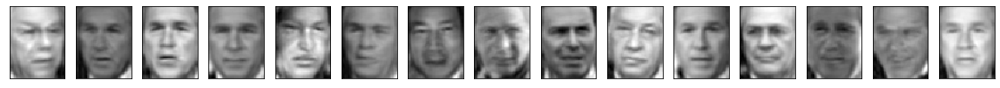

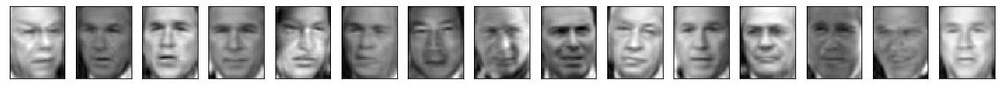

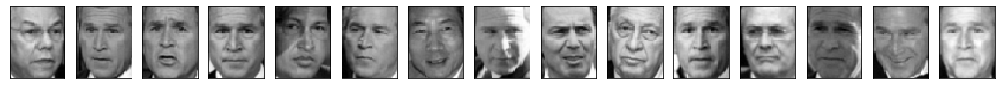

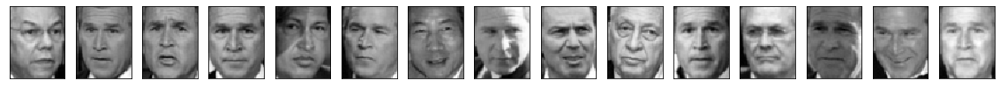

In [319]:
#Extra: Try other dimensionality reduction techniques - sklearn.decomposition.RandomizedPCA, sklearn.decomposition.FastICA  as well 
#(this extended analysis need not be submitted as part of homework)

"""

I will try the randomized PCA method below, in theory this method should be faster than standard PCA estimator
for larger datasets. For this exercise I will use another sklearn dataset called 'fetch_lfw_people' to test 
this other dimensionality reduction techinique.

result: Randomized PCA is indeed faster than conventional PCA 

"""

from sklearn.datasets import fetch_lfw_people
import timeit

#get dataset
faces = fetch_lfw_people(min_faces_per_person=60)
print(faces.target_names)
print(faces.images.shape)

#plot different number of components
for i in [10,100,1000]:
    
    #regular pca
    t1_i = time.time()
    pca = PCA(i).fit(faces.data)
    t1_elapsed_ms = (time.time() - t1_i)*1000
    components = pca.transform(faces.data)
    filtered = pca.inverse_transform(components)
    plot_faces(filtered)
    print('PCA')
    print('Number of Components: ' + str(i))
    print('Time Elapsed (ms): ' + str(t1_elapsed_ms))
    
    #randomized pca
    t2_i = time.time()
    pca_randomized = PCA(i, svd_solver='randomized').fit(faces.data)
    t2_elapsed_ms = (time.time() - t2_i)*1000
    components = pca_randomized.transform(faces.data)
    filtered = pca_randomized.inverse_transform(components)
    plot_faces(filtered)
    print('PCA Randomized')
    print('Number of Components: ' + str(i))
    print('Time Elapsed (ms): ' + str(t2_elapsed_ms))
    print('\n')
